In [1]:
from utils.detector_utils import draw_box_on_image, draw_label_on_image, load_inference_graph, detect_objects

Instructions for updating:
non-resource variables are not supported in the long term


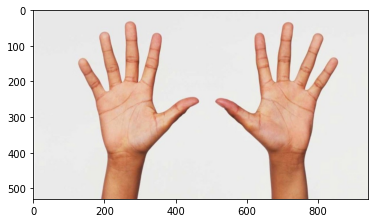

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = cv2.imread('./hands.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
from tensorflow.keras.models import load_model

In [4]:
detection_graph, sess = load_inference_graph()

> ====== loading HAND frozen graph into memory



>  ====== Hand Inference graph loaded.


In [16]:
boxes, scores = detect_objects(img, detection_graph, sess)
print(boxes)
#print(scores)

[[0.22747016 0.17435679 0.7695571  0.38991097]
 [0.28706896 0.56662434 0.741395   0.8566069 ]
 [0.06258903 0.20908892 0.4033721  0.35544723]
 [0.03420171 0.6911339  0.4219416  0.8182797 ]
 [0.36968803 0.19878379 0.7465993  0.3758947 ]
 [0.12145332 0.7914416  0.4757339  0.9000152 ]
 [0.4762736  0.55035585 0.73065215 0.73287874]
 [0.3433893  0.6564237  0.71326065 0.8474895 ]
 [0.07214488 0.7579874  0.4294086  0.8837663 ]
 [0.1046406  0.14944738 0.7383185  0.43717682]
 [0.19377965 0.13176775 0.52366585 0.2408166 ]
 [0.07748209 0.6763191  0.41477567 0.78537464]
 [0.15460317 0.14831865 0.48468697 0.2590767 ]
 [0.13177805 0.1575786  0.5049246  0.3036902 ]
 [0.6410499  0.69432634 0.96028215 0.8249591 ]
 [0.47757092 0.36734086 0.7084025  0.49213755]
 [0.18077049 0.34504622 0.72171116 0.50484604]
 [0.07772459 0.26154754 0.40746415 0.37614706]
 [0.40911287 0.55119306 0.65129846 0.6748859 ]
 [0.6391369  0.2172324  0.96335053 0.35867578]
 [0.15375683 0.8073934  0.5579041  0.9106284 ]
 [0.05527939 

100


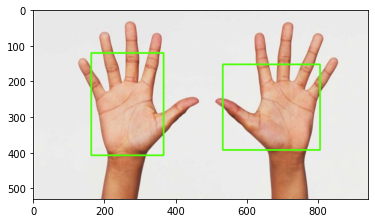

In [30]:
draw_box_on_image(len(boxes), 0.7, scores, boxes, img.shape[1], img.shape[0], img)
print(len(boxes))
plt.imshow(img)

In [3]:
import time

video_capture = cv2.VideoCapture(1)

pad = 0.05

detection_graph, sess = load_inference_graph()

crops = []
resized = []

blocker = False

skipper = 0

while True:
    skipper += 1
    ret, frame = video_capture.read()
    
    boxes, scores = detect_objects(frame, detection_graph, sess)
    if boxes is not None and skipper > 50:
        points = draw_box_on_image(len(boxes), 0.75, scores, boxes, frame.shape[1], frame.shape[0], frame, pad)
        
        if type(points) == tuple:
            points = list(points)
        
        for point in points:
            p1 = point[0]
            p2 = point[1]

            if p1 is not None and p2 is not None:
                left = max(0, p1[0])
                right = min(frame.shape[0], p2[0])
                top = max(0, p1[1])
                bottom = min(frame.shape[1], p2[1])

                print(left, right, top, bottom)
                
                crop = frame[top+2:bottom-2, left+2:right-2]
                crops.append(crop)
                
                crop_resized = cv2.resize(crop, (224,224))
                resized.append(crop_resized)
                if not blocker:
                    time.sleep(2.96)
                    blocker = True
                
    if blocker:
        draw_label_on_image("A", frame, p1, p2)
    cv2.imshow('Video', frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    
while True:
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

video_capture.release()
cv2.destroyAllWindows()

> ====== loading HAND frozen graph into memory



>  ====== Hand Inference graph loaded.
73 269 94 273
76 269 97 272
24 217 84 283
24 200 124 299
23 202 125 297
23 205 123 295
23 203 124 297
24 205 122 291
22 206 120 294
23 203 119 292
23 203 123 297
25 203 124 294
24 205 122 298
24 203 122 299
24 204 123 291
24 206 121 294
24 205 122 292
26 203 122 293
25 205 122 293
24 205 122 295
25 206 123 293
24 207 121 295
24 203 122 291
25 204 122 290
24 207 122 290
22 202 123 301
23 204 121 295
24 203 122 291
24 201 121 292
24 203 125 293
23 205 122 293
25 201 124 290
24 204 122 293
24 205 122 291
24 203 124 293
23 202 122 290
24 203 124 294
24 201 123 295
24 203 124 294
23 205 122 295
37 209 130 289
41 204 132 291


157


c:\python36\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


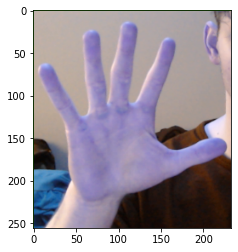

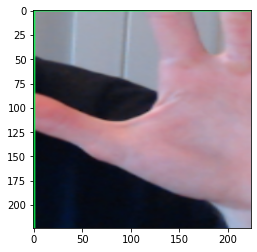

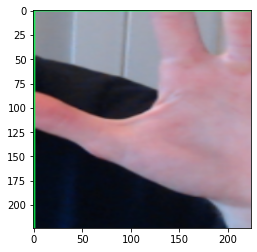

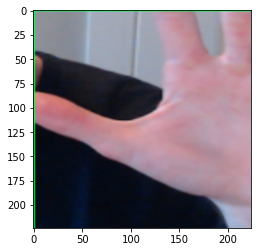

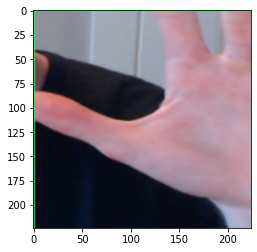

...

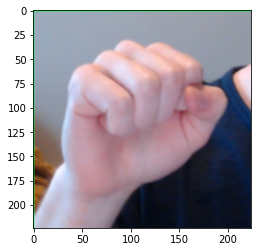

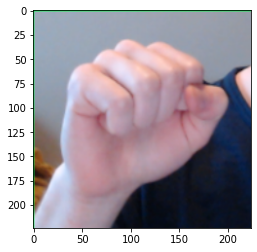

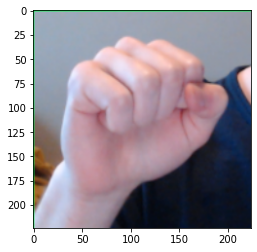

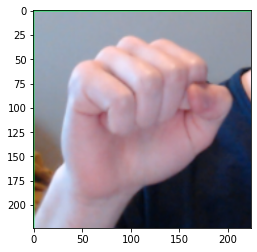

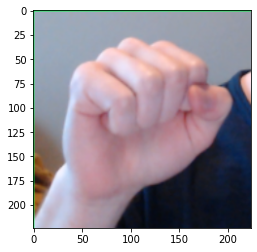

In [27]:

# for saug in crops:
#     if saug.size > 0:
#         plt.imshow(saug)
print(len(crops))

img2 = crops[50]

plt.imshow(img2)

# for crop in crops:
#     plt.figure()
#     crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
#     plt.imshow(crop)

for r in resized:
    plt.figure()
    r = cv2.cvtColor(r, cv2.COLOR_BGR2RGB)
    plt.imshow(r)

In [59]:
for crop in resized:
    print(crop.shape)

(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 

In [73]:
from tensorflow.keras.models import load_model

filepath = "./asl-alphabet-classifier"

model = load_model(filepath, compile=True)

images = np.empty((1, 224, 224, 3))
images[0] = resized[66]

#samples = np.array(resized[135:])

before = images
after = np.empty((1, 224, 224, 3))
after[0] = cv2.cvtColor(resized[66], cv2.COLOR_BGR2RGB)

predictions_before = model.predict(before, batch_size=1)
predictions_after = model.predict(after, batch_size=1)


#print(predictions[:-3])

In [52]:
import tensorflow
import tensorflow.keras as keras
print(tensorflow.__version__)
print(keras.__version__)

1.15.0
2.2.4-tf


In [74]:

print(np.amax(predictions_before))
print(np.amax(predictions_after))

0.17262739
0.29668105


w
A


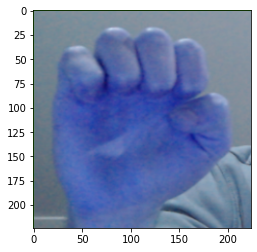

In [78]:


print(chr(ord('a') + np.argmax(predictions_before[0,:-3])))
print(chr(ord('A') + np.argmax(predictions_after[0,:-3])))

plt.imshow(resized[66])


In [23]:
copies = resized[:]

68


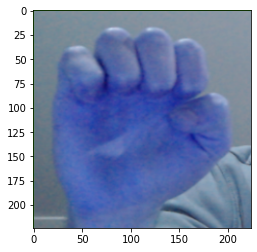

In [72]:
print(len(resized))

plt.imshow(resized[66])

274


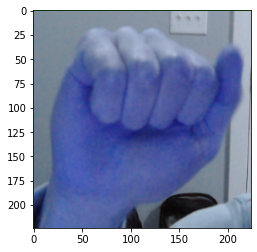

In [52]:
print(len(copies))
plt.imshow(copies[100])

In [ ]:
video_capture = cv2.VideoCapture(1)

pad = 0.05

detection_graph, sess = load_inference_graph()

crops = []
resized = []

skipper = 0

while True:
    skipper += 1
    ret, frame = video_capture.read()
    
    boxes, scores = detect_objects(frame, detection_graph, sess)
    if boxes is not None and skipper > 100:
        points = draw_box_on_image(len(boxes), 0.75, scores, boxes, frame.shape[1], frame.shape[0], frame, pad)
        
        if type(points) == tuple:
            points = list(points)
        
        for point in points:
            p1 = point[0]
            p2 = point[1]

            if p1 is not None and p2 is not None:
                left = max(0, p1[0])
                right = min(frame.shape[0], p2[0])
                top = max(0, p1[1])
                bottom = min(frame.shape[1], p2[1])

                print(left, right, top, bottom)
                
                crop = frame[top+2:bottom-2, left+2:right-2]
                crops.append(crop)
                
                crop_resized = cv2.resize(crop, (224,224))
                resized.append(crop_resized)
                
        if len(resized) > 0 and skipper > 200:
            break
        
    cv2.imshow('Video', frame)
                
                
    #             if crop.size > 0:
    #                 plt.imshow(crop)

cv2.imshow('Video', frame)

filepath = "./asl-alphabet-classifier"

model = load_model(filepath, compile=True)

after = np.empty((1, 224, 224, 3))
after[0] = cv2.cvtColor(resized[0], cv2.COLOR_BGR2RGB)

predictions_after = model.predict(after, batch_size=1)

label = chr(ord('A') + np.argmax(predictions_after[0,:-3]))

draw_label_on_image(label, frame, p1, p2)
    
while True:
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

video_capture.release()
cv2.destroyAllWindows()

> ====== loading HAND frozen graph into memory



>  ====== Hand Inference graph loaded.
